# Тест агента
**наш агент** (`agent_bundle_swarm 2/agent.py`) vs **submission.py**

In [1]:
import importlib.util, sys, os, math
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from kaggle_environments import make

HERE     = os.path.dirname(os.path.abspath("__file__")) if "__file__" in dir() else os.getcwd()
OUR_PATH = os.path.join(HERE, "agent_bundle_swarm 2", "agent.py")
SUB_PATH = os.path.join(HERE, "sub2.py")

def load_agent(path, name):
    if name in sys.modules:
        del sys.modules[name]
    spec = importlib.util.spec_from_file_location(name, path)
    mod  = importlib.util.module_from_spec(spec)
    sys.modules[name] = mod
    spec.loader.exec_module(mod)
    return mod.agent

our_agent    = load_agent(OUR_PATH, "our_agent")
strong_agent = load_agent(SUB_PATH, "sub")

SEED = 4344  # один сид для дебаг-лога + визуализации

print("our_agent   :", our_agent)
print("strong_agent:", strong_agent)
print("SEED        :", SEED)

Loading environment cabt failed: dlopen(/opt/anaconda3/envs/colabus/lib/python3.12/site-packages/kaggle_environments/envs/cabt/cg/libcg.so, 0x0006): tried: '/opt/anaconda3/envs/colabus/lib/python3.12/site-packages/kaggle_environments/envs/cabt/cg/libcg.so' (slice is not valid mach-o file), '/System/Volumes/Preboot/Cryptexes/OS/opt/anaconda3/envs/colabus/lib/python3.12/site-packages/kaggle_environments/envs/cabt/cg/libcg.so' (no such file), '/opt/anaconda3/envs/colabus/lib/python3.12/site-packages/kaggle_environments/envs/cabt/cg/libcg.so' (slice is not valid mach-o file)


[kaggle_environments.envs.open_spiel_env.open_spiel_env] INFO: Successfully loaded OpenSpiel environments: 16.


[kaggle_environments.envs.open_spiel_env.open_spiel_env] INFO:    open_spiel_backgammon


[kaggle_environments.envs.open_spiel_env.open_spiel_env] INFO:    open_spiel_checkers


[kaggle_environments.envs.open_spiel_env.open_spiel_env] INFO:    open_spiel_chess


[kaggle_environments.envs.open_spiel_env.open_spiel_env] INFO:    open_spiel_connect_four


[kaggle_environments.envs.open_spiel_env.open_spiel_env] INFO:    open_spiel_gin_rummy


[kaggle_environments.envs.open_spiel_env.open_spiel_env] INFO:    open_spiel_go


[kaggle_environments.envs.open_spiel_env.open_spiel_env] INFO:    open_spiel_goofspiel


[kaggle_environments.envs.open_spiel_env.open_spiel_env] INFO:    open_spiel_hearts


[kaggle_environments.envs.open_spiel_env.open_spiel_env] INFO:    open_spiel_hex


[kaggle_environments.envs.open_spiel_env.open_spiel_env] INFO:    open_spiel_matching_pennies_3p


[kaggle_environments.envs.open_spiel_env.open_spiel_env] INFO:    open_spiel_othello


[kaggle_environments.envs.open_spiel_env.open_spiel_env] INFO:    open_spiel_repeated_game


[kaggle_environments.envs.open_spiel_env.open_spiel_env] INFO:    open_spiel_tic_tac_toe


[kaggle_environments.envs.open_spiel_env.open_spiel_env] INFO:    open_spiel_universal_poker


[kaggle_environments.envs.open_spiel_env.open_spiel_env] INFO:    open_spiel_repeated_poker


[kaggle_environments.envs.open_spiel_env.open_spiel_env] INFO:    open_spiel_python_repeated_pokerkit


[kaggle_environments.envs.open_spiel_env.open_spiel_env] INFO: OpenSpiel games skipped: 1.


[kaggle_environments.envs.open_spiel_env.open_spiel_env] INFO:    snake


our_agent   : <function agent at 0x13dc6a660>
strong_agent: <function agent at 0x13dc8ab60>
SEED        : 4344


## Дебаг-лог одного матча (наш + submission параллельно)

Запускает ОДИН матч (тот же `SEED`) с включённым per-turn логированием для **обоих** агентов:

- наш агент → `agent_debug.log` (зоны, приоритеты, все планы, причины FIRE/SKIP, итоговые движения).
- submission → `submission_debug.log` (modes, policy.attack_budget, все построенные missions с score).

Управление env vars:
- `ORBIT_AGENT_LOG` / `SUB_AGENT_LOG` — пути к лог-файлам (обязательно для активации).
- `ORBIT_AGENT_LOG_PLANS_ALL=1` — все кандидатные планы нашего агента.
- `ORBIT_AGENT_LOG_FLEETS=1` / `SUB_AGENT_LOG_FLEETS=1` — дамп летящих флотов.
- `SUB_AGENT_LOG_MISSIONS_ALL=1` — все missions submission (по умолчанию top-30).

После запуска: грепай `===== TURN N` в обоих файлах и сравнивай ход за ходом.

In [2]:
OUR_LOG = os.path.join(HERE, "agent_debug.log")
SUB_LOG = os.path.join(HERE, "submission_debug.log")

for _p in (OUR_LOG, SUB_LOG):
    if os.path.exists(_p):
        os.remove(_p)

os.environ["ORBIT_AGENT_LOG"]            = OUR_LOG
os.environ["ORBIT_AGENT_LOG_PLANS_ALL"]  = "1"
os.environ["ORBIT_AGENT_LOG_FLEETS"]     = "0"

os.environ["SUB_AGENT_LOG"]              = SUB_LOG
os.environ["SUB_AGENT_LOG_MISSIONS_ALL"] = "0"
os.environ["SUB_AGENT_LOG_FLEETS"]       = "0"

for _modname in ("our_agent", "agent_debug", "sub", "submission_debug"):
    if _modname in sys.modules:
        del sys.modules[_modname]

import agent_debug as _adbg
_adbg.reset()
import submission_debug as _sdbg
_sdbg.reset()

our_agent_dbg = load_agent(OUR_PATH, "our_agent")

_spec = importlib.util.spec_from_file_location("sub", SUB_PATH)
sub_mod_dbg = importlib.util.module_from_spec(_spec)
sys.modules["sub"] = sub_mod_dbg
_spec.loader.exec_module(sub_mod_dbg)

strong_agent_dbg = _sdbg.wrap(sub_mod_dbg)

env_dbg = make("orbit_wars", debug=False, configuration={"seed": SEED})
env_dbg.run([our_agent_dbg, strong_agent_dbg])

final_dbg = env_dbg.steps[-1]
for i, s in enumerate(final_dbg):
    label = "our" if i == 0 else "sub"
    print(f"  P{i} ({label}): reward={s.reward}  status={s.status}  (seed={SEED})")

for label, path in [("our", OUR_LOG), ("sub", SUB_LOG)]:
    size = os.path.getsize(path) if os.path.exists(path) else 0
    print(f"\nЛог [{label}]: {path}  ({size:,} байт)")
    if size:
        with open(path, "r", encoding="utf-8") as f:
            tail = f.readlines()[-30:]
        print(f"--- последние {len(tail)} строк ---")
        print("".join(tail))

env_dbg.render(mode="ipython", width=800, height=600)

  P0 (our): reward=-1  status=DONE  (seed=4344)
  P1 (sub): reward=1  status=DONE  (seed=4344)

Лог [our]: /Users/adel/Documents/GitHub/OrbitWW/agent_debug.log  (1,195,162 байт)
--- последние 30 строк ---
    26   1 periphery           +0.40     1    63       0   -360.28    -1.00   46.4     0
    11   1 periphery           +0.33     4   114       0   -481.51    -1.00   65.3     0
    18   1 periphery           +0.33     1    49       0   -419.67    -1.00   47.4     0
    27   1 periphery           +0.29     1    81       0   -401.35    -1.00   46.3     0
    22   1 hard_far            +0.29     5   176       0   -728.53    -1.00   58.0     0
    29   1 periphery           +0.21     1    45       0   -282.53    -1.00   58.5     0
    19   1 periphery           +0.06     1   148       0   -407.91    -1.00   47.4     0
    17   1 periphery           +0.02     1   112       0   -511.76    -1.00   47.4     0
    28   1 periphery           -0.11     1    87       0   -424.94    -1.00   58.5 

## График: корабли и производство по ходам (дебаг-матч)

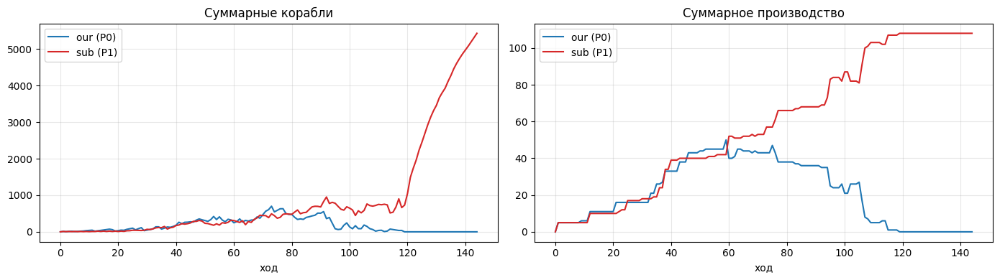

In [3]:
def extract_timeseries(env_obj):
    rows = []
    for step_idx, step in enumerate(env_obj.steps):
        obs     = step[0].observation
        planets = obs.get("planets", []) if isinstance(obs, dict) else obs.planets
        row     = {"step": step_idx}
        for pid in (0, 1):
            owned = [p for p in planets if (p[1] if isinstance(p, list) else p.owner) == pid]
            row[f"ships_p{pid}"] = sum(p[5] if isinstance(p, list) else p.ships for p in owned)
            row[f"prod_p{pid}"]  = sum(p[6] if isinstance(p, list) else p.production for p in owned)
        rows.append(row)
    return pd.DataFrame(rows)

ts = extract_timeseries(env_dbg)

fig, axes = plt.subplots(1, 2, figsize=(14, 4))
axes[0].plot(ts["step"], ts["ships_p0"], label="our (P0)", color="tab:blue")
axes[0].plot(ts["step"], ts["ships_p1"], label="sub (P1)", color="tab:red")
axes[0].set_title("Суммарные корабли"); axes[0].set_xlabel("ход")
axes[0].legend(); axes[0].grid(alpha=0.3)

axes[1].plot(ts["step"], ts["prod_p0"], label="our (P0)", color="tab:blue")
axes[1].plot(ts["step"], ts["prod_p1"], label="sub (P1)", color="tab:red")
axes[1].set_title("Суммарное производство"); axes[1].set_xlabel("ход")
axes[1].legend(); axes[1].grid(alpha=0.3)

plt.tight_layout()
plt.show()

## Параллельный батч (ProcessPoolExecutor)

Запускает N матчей параллельно через `match_runner.run_match` (воркер в отдельном `.py` — требование macOS spawn-режима).  
Результаты: winrate, финальные корабли/производство, временны́е ряды для каждого матча.

In [4]:
from concurrent.futures import ProcessPoolExecutor, as_completed
from tqdm.notebook import tqdm
import time

# match_runner.py должен лежать рядом с этим ноутбуком
if HERE not in sys.path:
    sys.path.insert(0, HERE)
from match_runner import run_match

# ── КОНФИГ БАТЧА ────────────────────────────────────────────────────────────
BATCH_SEEDS = list(range(20))     # ← количество/список сидов
N_WORKERS   = max(2, os.cpu_count() // 2)  # ← параллельность
OPPONENT    = 'sub2'              # 'sub2' или 'noop'
WEIGHTS     = {}                  # {} = дефолты; {'neutral_garrison': 8, ...} — переопределения
# ────────────────────────────────────────────────────────────────────────────

tasks = [
    {
        'seed':     s,
        'our_path': OUR_PATH,
        'opp':      OPPONENT,
        'weights':  WEIGHTS,
        'label':    OPPONENT,
    }
    for s in BATCH_SEEDS
]

print(f"Задач: {len(tasks)}  |  воркеров: {N_WORKERS}  |  оппонент: {OPPONENT}")
if WEIGHTS:
    print(f"Веса: {WEIGHTS}")

Задач: 20  |  воркеров: 5  |  оппонент: sub2


In [5]:
# ── ЗАПУСК ──────────────────────────────────────────────────────────────────
results = []
errors  = []
t0 = time.time()

with ProcessPoolExecutor(max_workers=N_WORKERS) as ex:
    futs = {ex.submit(run_match, t): t for t in tasks}
    for fut in tqdm(as_completed(futs), total=len(tasks), desc="матчи"):
        try:
            r = fut.result()
            results.append(r)
        except Exception as e:
            task = futs[fut]
            errors.append((task['seed'], str(e)))
            print(f"  ERROR seed={task['seed']}: {e}")

elapsed = time.time() - t0
df = pd.DataFrame(results).sort_values('seed').reset_index(drop=True)

n    = len(df)
wins = int(df['win'].sum())
draws= int(df['draw'].sum())

print(f"\nГотово за {elapsed:.1f}s  ({elapsed/max(n,1):.1f}s/матч)")
print(f"Winrate: {wins}/{n} = {wins/max(n,1):.1%}  |  Ничьих: {draws}  |  Ошибок: {len(errors)}")
if errors:
    for seed, msg in errors:
        print(f"  seed={seed}: {msg}")

матчи:   0%|          | 0/20 [00:00<?, ?it/s]

Loading environment cabt failed: dlopen(/opt/anaconda3/envs/colabus/lib/python3.12/site-packages/kaggle_environments/envs/cabt/cg/libcg.so, 0x0006): tried: '/opt/anaconda3/envs/colabus/lib/python3.12/site-packages/kaggle_environments/envs/cabt/cg/libcg.so' (slice is not valid mach-o file), '/System/Volumes/Preboot/Cryptexes/OS/opt/anaconda3/envs/colabus/lib/python3.12/site-packages/kaggle_environments/envs/cabt/cg/libcg.so' (no such file), '/opt/anaconda3/envs/colabus/lib/python3.12/site-packages/kaggle_environments/envs/cabt/cg/libcg.so' (slice is not valid mach-o file)
[kaggle_environments.envs.open_spiel_env.open_spiel_env] INFO: Successfully loaded OpenSpiel environments: 16.
[kaggle_environments.envs.open_spiel_env.open_spiel_env] INFO:    open_spiel_backgammon
[kaggle_environments.envs.open_spiel_env.open_spiel_env] INFO:    open_spiel_checkers
[kaggle_environments.envs.open_spiel_env.open_spiel_env] INFO:    open_spiel_chess
[kaggle_environments.envs.open_spiel_env.open_spiel_en


Готово за 79.8s  (4.0s/матч)
Winrate: 8/20 = 40.0%  |  Ничьих: 0  |  Ошибок: 0


## Результаты батча

In [6]:
# ── СВОДНАЯ ТАБЛИЦА ─────────────────────────────────────────────────────────
summary = pd.DataFrame({
    'метрика': [
        'матчей', 'побед', 'поражений', 'ничьих', 'winrate',
        'avg steps', 'avg ships_diff',
        'avg prod0_final', 'avg prod1_final',
        'avg ships0_final', 'avg ships1_final',
    ],
    'значение': [
        n, wins, n - wins - draws, draws,
        f"{wins/max(n,1):.1%}",
        f"{df['steps'].mean():.1f}",
        f"{df['ships_diff'].mean():+.1f}",
        f"{df['prod0_final'].mean():.1f}",
        f"{df['prod1_final'].mean():.1f}",
        f"{df['ships0_final'].mean():.0f}",
        f"{df['ships1_final'].mean():.0f}",
    ]
})
display(summary.set_index('метрика'))

# Детальная таблица по сидам
cols = ['seed', 'win', 'draw', 'steps', 'n0_final', 'n1_final',
        'ships_diff', 'prod0_final', 'prod1_final', 'time_sec']
display(df[cols].style.applymap(
    lambda v: 'background-color: #d4edda' if v == 1 else
              ('background-color: #f8d7da' if v == 0 else ''),
    subset=['win']
))

,значение
метрика,
матчей,20
побед,8
поражений,12
ничьих,0
winrate,40.0%
avg steps,178.8
avg ships_diff,-294.9
avg prod0_final,27.9
avg prod1_final,44.7


/var/folders/xg/q82r22r5461fgsby1v63gp000000gn/T/ipykernel_25739/677481692.py:25: FutureWarning: Styler.applymap has been deprecated. Use Styler.map instead.
  display(df[cols].style.applymap(


,seed,win,draw,steps,n0_final,n1_final,ships_diff,prod0_final,prod1_final,time_sec
0,0,0,0,133,0,24,-2673.000000,0.000000,72.000000,8.900000
1,1,1,0,159,28,0,6284.000000,88.000000,0.000000,8.300000
2,2,0,0,226,0,32,-5761.000000,0.000000,92.000000,29.000000
3,3,0,0,151,0,20,-2658.000000,0.000000,64.000000,10.300000
4,4,1,0,158,28,0,3264.000000,68.000000,0.000000,12.700000
5,5,1,0,188,31,0,4918.000000,83.000000,0.000000,16.000000
6,6,1,0,312,32,0,3300.000000,52.000000,0.000000,46.700000
7,7,1,0,177,27,0,3381.000000,87.000000,0.000000,14.400000
8,8,1,0,211,36,0,5226.000000,84.000000,0.000000,31.100000
9,9,0,0,101,0,26,-1363.000000,0.000000,50.000000,8.700000


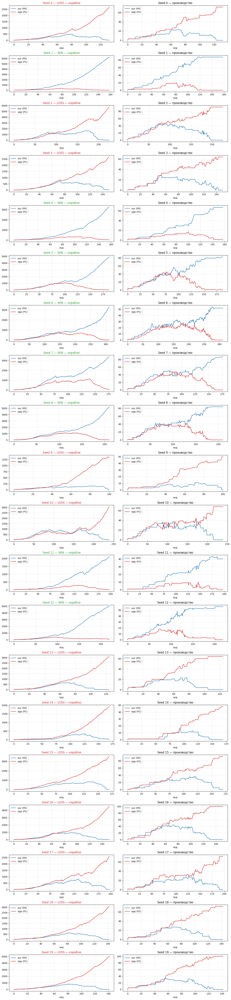

In [7]:
# ── ВРЕМЕННЫ́Е РЯДЫ: корабли + производство по каждому матчу ──────────────
n_seeds = len(df)
fig, axes = plt.subplots(n_seeds, 2, figsize=(14, 3 * n_seeds), squeeze=False)

for i, row in df.iterrows():
    seed  = row['seed']
    label = "WIN" if row['win'] else ("DRAW" if row['draw'] else "LOSS")
    title_color = "tab:green" if row['win'] else ("tab:orange" if row['draw'] else "tab:red")

    ax_s = axes[i, 0]
    ax_p = axes[i, 1]

    ax_s.plot(row['ts_ships0'], label='our (P0)', color='tab:blue')
    ax_s.plot(row['ts_ships1'], label='opp (P1)', color='tab:red')
    ax_s.set_title(f"Seed {seed} — {label} — корабли", color=title_color)
    ax_s.set_xlabel("ход"); ax_s.legend(); ax_s.grid(alpha=0.3)

    ax_p.plot(row['ts_prod0'], label='our (P0)', color='tab:blue')
    ax_p.plot(row['ts_prod1'], label='opp (P1)', color='tab:red')
    ax_p.set_title(f"Seed {seed} — производство")
    ax_p.set_xlabel("ход"); ax_p.legend(); ax_p.grid(alpha=0.3)

plt.tight_layout()
plt.show()

In [8]:
# ── СОХРАНИТЬ РЕЗУЛЬТАТЫ (опционально) ──────────────────────────────────────
from datetime import datetime
ts_str = datetime.now().strftime('%Y%m%d_%H%M%S')
out_dir = os.path.join(HERE, "out")
os.makedirs(out_dir, exist_ok=True)

# Сохраняем без временны́х рядов (они большие и не нужны в CSV)
save_cols = [c for c in df.columns if not c.startswith('ts_')]
out_csv = os.path.join(out_dir, f"batch_{OPPONENT}_{ts_str}.csv")
df[save_cols].to_csv(out_csv, index=False)
print(f"Сохранено: {out_csv}")

Сохранено: /Users/adel/Documents/GitHub/OrbitWW/out/batch_sub2_20260515_172607.csv
